In [1]:
import emat, os, numpy, pandas, functools, asyncio
emat.versions()

emat 0.5.2, plotly 4.14.0


In [2]:
logger = emat.util.loggers.log_to_stderr(30, True)

In [3]:
road_test_scope_file = emat.package_file('model','tests','road_test.yaml')

In [4]:
road_scope = emat.Scope(road_test_scope_file)
road_scope

<emat.Scope with 2 constants, 7 uncertainties, 4 levers, 7 measures>

In [5]:
road_scope.info()

name: EMAT Road Test
desc: prototype run
constants:
  free_flow_time = 60
  initial_capacity = 100
uncertainties:
  alpha = 0.1 to 0.2
  beta = 3.5 to 5.5
  input_flow = 80 to 150
  value_of_time = 0.001 to 0.25
  unit_cost_expansion = 95.0 to 145.0
  interest_rate = 0.025 to 0.04
  yield_curve = -0.0025 to 0.02
levers:
  expand_capacity = 0.0 to 100.0
  amortization_period = 15 to 50
  debt_type = categorical
  interest_rate_lock = boolean
measures:
  no_build_travel_time
  build_travel_time
  time_savings
  value_of_time_savings
  net_benefits
  cost_of_capacity_expansion
  present_cost_expansion


In [6]:
road_scope.get_constants()

[Constant('free_flow_time', 60), Constant('initial_capacity', 100)]

In [7]:
road_scope.get_uncertainties()

[<emat.RealParameter 'alpha'>,
 <emat.RealParameter 'beta'>,
 <emat.IntegerParameter 'input_flow'>,
 <emat.RealParameter 'value_of_time'>,
 <emat.RealParameter 'unit_cost_expansion'>,
 <emat.RealParameter 'interest_rate'>,
 <emat.RealParameter 'yield_curve'>]

In [8]:
road_scope.get_levers()

[<emat.RealParameter 'expand_capacity'>,
 <emat.IntegerParameter 'amortization_period'>,
 <emat.CategoricalParameter 'debt_type'>,
 <emat.BooleanParameter 'interest_rate_lock'>]

In [9]:
road_scope.get_measures()

[Measure('no_build_travel_time'),
 Measure('build_travel_time'),
 Measure('time_savings'),
 Measure('value_of_time_savings'),
 Measure('net_benefits'),
 Measure('cost_of_capacity_expansion'),
 Measure('present_cost_expansion')]

In [10]:
emat_db = emat.SQLiteDB('tempfile')

In [11]:
road_scope.store_scope(emat_db)

In [12]:
try:
    road_scope.store_scope(emat_db)
except KeyError as err:
    print(err)

'scope named "EMAT Road Test" already exists'


In [13]:
emat_db.read_scope_names()

['EMAT Road Test']

In [14]:
from emat.experiment.experimental_design import design_experiments

In [15]:
design = design_experiments(road_scope, db=emat_db, n_samples_per_factor=10, sampler='lhs')
design.head()

,alpha,amortization_period,beta,debt_type,expand_capacity,input_flow,interest_rate,interest_rate_lock,unit_cost_expansion,value_of_time,yield_curve,free_flow_time,initial_capacity
experiment,,,,,,,,,,,,,
1,0.184682,38,5.237143,Rev Bond,18.224793,115,0.031645,False,118.213466,0.059510,0.015659,60,100
2,0.166133,36,4.121963,Paygo,87.525790,129,0.037612,True,141.322696,0.107772,0.007307,60,100
3,0.198937,44,4.719838,GO Bond,45.698048,105,0.028445,False,97.783320,0.040879,-0.001545,60,100
4,0.158758,42,4.915816,GO Bond,51.297546,113,0.036234,True,127.224901,0.182517,0.004342,60,100
5,0.157671,42,3.845952,Paygo,22.824149,133,0.039257,False,107.820482,0.067102,0.001558,60,100


In [16]:
large_design = design_experiments(road_scope, db=emat_db, n_samples=5000, sampler='lhs', design_name='lhs_large')
large_design.head()

,alpha,amortization_period,beta,debt_type,expand_capacity,input_flow,interest_rate,interest_rate_lock,unit_cost_expansion,value_of_time,yield_curve,free_flow_time,initial_capacity
experiment,,,,,,,,,,,,,
111,0.154130,21,5.061648,Rev Bond,75.542217,112,0.029885,True,124.452736,0.056335,0.001425,60,100
112,0.148731,29,4.088663,Rev Bond,91.184595,145,0.028659,False,131.688623,0.051854,0.007850,60,100
113,0.124027,34,3.956884,Paygo,60.436585,80,0.038101,False,95.462532,0.045672,0.011101,60,100
114,0.129724,41,4.969628,Paygo,74.271040,139,0.029665,False,98.206495,0.044312,0.010072,60,100
115,0.185723,22,4.485432,Paygo,61.084166,95,0.039195,False,140.792308,0.144629,0.019277,60,100


In [17]:
emat_db.read_design_names('EMAT Road Test')

['lhs', 'lhs_large']

In [18]:
from emat.model.core_python import PythonCoreModel, Road_Capacity_Investment

In [19]:
m = PythonCoreModel(Road_Capacity_Investment, scope=road_scope, db=emat_db)

In [20]:
lhs_results = m.run_experiments(design_name='lhs')
lhs_results.head()

,alpha,beta,input_flow,value_of_time,unit_cost_expansion,interest_rate,yield_curve,expand_capacity,amortization_period,debt_type,interest_rate_lock,free_flow_time,initial_capacity,no_build_travel_time,build_travel_time,time_savings,value_of_time_savings,net_benefits,cost_of_capacity_expansion,present_cost_expansion
experiment,,,,,,,,,,,,,,,,,,,,
1,0.184682,5.237143,115,0.059510,118.213466,0.031645,0.015659,18.224793,38,Rev Bond,False,60,100,83.038716,69.586789,13.451927,92.059972,-22.290905,114.350877,2154.415985
2,0.166133,4.121963,129,0.107772,141.322696,0.037612,0.007307,87.525790,36,Paygo,True,60,100,88.474313,62.132583,26.341730,366.219659,-16.843014,383.062672,12369.380535
3,0.198937,4.719838,105,0.040879,97.783320,0.028445,-0.001545,45.698048,44,GO Bond,False,60,100,75.027180,62.543328,12.483852,53.584943,-113.988412,167.573355,4468.506839
4,0.158758,4.915816,113,0.182517,127.224901,0.036234,0.004342,51.297546,42,GO Bond,True,60,100,77.370428,62.268768,15.101660,311.462907,11.539561,299.923347,6526.325171
5,0.157671,3.845952,133,0.067102,107.820482,0.039257,0.001558,22.824149,42,Paygo,False,60,100,88.328990,72.848428,15.480561,138.156464,78.036616,60.119848,2460.910705


In [21]:
lhs_large_async = m.async_experiments(large_design, max_n_workers=8, batch_size=157)

In [22]:
lhs_large_results = await lhs_large_async.final_results()

IntProgress(value=5000, max=5000)

In [23]:
reload_results = m.read_experiments(design_name='lhs')
reload_results.head()

,free_flow_time,initial_capacity,alpha,beta,input_flow,value_of_time,unit_cost_expansion,interest_rate,yield_curve,expand_capacity,amortization_period,debt_type,interest_rate_lock,no_build_travel_time,build_travel_time,time_savings,value_of_time_savings,net_benefits,cost_of_capacity_expansion,present_cost_expansion
experiment,,,,,,,,,,,,,,,,,,,,
1,60,100,0.184682,5.237143,115,0.059510,118.213466,0.031645,0.015659,18.224793,38,Rev Bond,False,83.038716,69.586789,13.451927,92.059972,-22.290905,114.350877,2154.415985
2,60,100,0.166133,4.121963,129,0.107772,141.322696,0.037612,0.007307,87.525790,36,Paygo,True,88.474313,62.132583,26.341730,366.219659,-16.843014,383.062672,12369.380535
3,60,100,0.198937,4.719838,105,0.040879,97.783320,0.028445,-0.001545,45.698048,44,GO Bond,False,75.027180,62.543328,12.483852,53.584943,-113.988412,167.573355,4468.506839
4,60,100,0.158758,4.915816,113,0.182517,127.224901,0.036234,0.004342,51.297546,42,GO Bond,True,77.370428,62.268768,15.101660,311.462907,11.539561,299.923347,6526.325171
5,60,100,0.157671,3.845952,133,0.067102,107.820482,0.039257,0.001558,22.824149,42,Paygo,False,88.328990,72.848428,15.480561,138.156464,78.036616,60.119848,2460.910705


In [24]:
lhs_params = m.read_experiment_parameters(design_name='lhs')
lhs_params.head()

,free_flow_time,initial_capacity,alpha,beta,input_flow,value_of_time,unit_cost_expansion,interest_rate,yield_curve,expand_capacity,amortization_period,debt_type,interest_rate_lock
experiment,,,,,,,,,,,,,
1,60,100,0.184682,5.237143,115,0.059510,118.213466,0.031645,0.015659,18.224793,38,Rev Bond,False
2,60,100,0.166133,4.121963,129,0.107772,141.322696,0.037612,0.007307,87.525790,36,Paygo,True
3,60,100,0.198937,4.719838,105,0.040879,97.783320,0.028445,-0.001545,45.698048,44,GO Bond,False
4,60,100,0.158758,4.915816,113,0.182517,127.224901,0.036234,0.004342,51.297546,42,GO Bond,True
5,60,100,0.157671,3.845952,133,0.067102,107.820482,0.039257,0.001558,22.824149,42,Paygo,False


In [25]:
lhs_outcomes = m.read_experiment_measures(design_name='lhs')
lhs_outcomes.head()

,,no_build_travel_time,build_travel_time,time_savings,value_of_time_savings,net_benefits,cost_of_capacity_expansion,present_cost_expansion
experiment,run,,,,,,,
1,e7f4ab16-4d38-11ee-8632-a87eeaeee0a2,83.038716,69.586789,13.451927,92.059972,-22.290905,114.350877,2154.415985
2,e7fcce28-4d38-11ee-bd2c-a87eeaeee0a2,88.474313,62.132583,26.341730,366.219659,-16.843014,383.062672,12369.380535
3,e804f710-4d38-11ee-a5d9-a87eeaeee0a2,75.027180,62.543328,12.483852,53.584943,-113.988412,167.573355,4468.506839
4,e80c39aa-4d38-11ee-965c-a87eeaeee0a2,77.370428,62.268768,15.101660,311.462907,11.539561,299.923347,6526.325171
5,e813ee15-4d38-11ee-834f-a87eeaeee0a2,88.328990,72.848428,15.480561,138.156464,78.036616,60.119848,2460.910705


In [26]:
m.get_feature_scores('lhs')

,alpha,beta,input_flow,value_of_time,unit_cost_expansion,interest_rate,yield_curve,expand_capacity,amortization_period,debt_type,interest_rate_lock
no_build_travel_time,0.075444,0.060221,0.540386,0.039323,0.037390,0.046159,0.040861,0.051164,0.049716,0.030621,0.028717
build_travel_time,0.055973,0.049988,0.261898,0.057534,0.052644,0.050073,0.053859,0.318194,0.035832,0.035718,0.028288
time_savings,0.092528,0.079272,0.443769,0.049315,0.041853,0.049267,0.051544,0.078433,0.046920,0.034810,0.032290
value_of_time_savings,0.088381,0.066305,0.313696,0.180042,0.040443,0.059434,0.061504,0.068176,0.053497,0.036622,0.031900
net_benefits,0.074451,0.055493,0.277536,0.096591,0.058608,0.049967,0.062057,0.179746,0.076616,0.043170,0.025766
cost_of_capacity_expansion,0.033834,0.037829,0.037349,0.036240,0.079136,0.045176,0.037441,0.523266,0.105854,0.039362,0.024514
present_cost_expansion,0.032350,0.031131,0.031986,0.036581,0.089316,0.044133,0.030549,0.627419,0.031182,0.024638,0.020715


Time Savings

<xmle.Elem 'img' with 0 children>
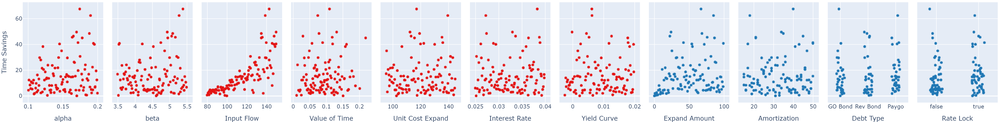

Net Benefits

<xmle.Elem 'img' with 0 children>
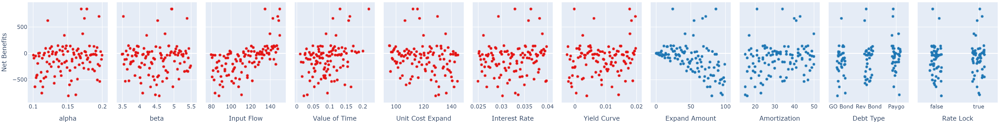

Input Flow

<xmle.Elem 'img' with 0 children>
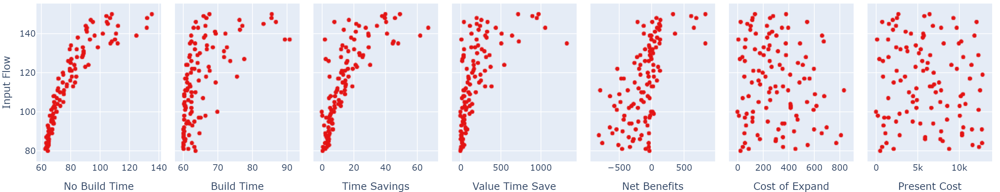

In [27]:
from emat.analysis import display_experiments
display_experiments(road_scope, lhs_results, rows=['time_savings', 'net_benefits', 'input_flow'])

In [32]:
from emat.analysis.prim import Prim
of_interest = lhs_large_results['net_benefits']>0
discovery = Prim(
    m.read_experiment_parameters(design_name='lhs_large'),
    of_interest,
    scope=road_scope,
)

In [31]:
box1 = discovery.find_box()
box1.tradeoff_selector()

AttributeError: type object 'DOMWidget' has no attribute '_ipython_display_'

FigureWidget({
    'data': [{'hoverinfo': 'text',
              'marker': {'color': array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
                                         2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
                                         4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5], dtype=object),
                         'colorbar': {'tickmode': 'array',
                                      'ticks': 'outside',
                                      'ticktext': [0, 1, 2, 3, 4, 5],
                                      'tickvals': array([0.41666667, 1.25      , 2.08333333, 2.91666667, 3.75      , 4.58333333]),
                                      'title': {'side': 'right', 'text': 'Number of Restricted Dimensions'}},
                         'colorscale': [[0.0, 'rgb(70, 49, 126)'],
                                        [0.16666666666666666, 'rgb(70, 49, 126)'],
                                        [0.16666666666666666, 'rgb(54, 91, 140)'],
                                        [0.3333333333333333, 'rgb(54, 91, 140)'],
                                        [0.3333333333333333, 'rgb(39, 126, 142)'],
                                        [0.5, 'rgb(39, 126, 142)'], [0.5, 'rgb(31,
                                        161, 135)'], [0.6666666666666666, 'rgb(31,
                                        161, 135)'], [0.6666666666666666, 'rgb(73,
                                        193, 109)'], [0.8333333333333334, 'rgb(73,
                                        193, 109)'], [0.8333333333333334, 'rgb(159,
                                        217, 56)'], [1.0, 'rgb(159, 217, 56)']],
                         'showscale': True,
                         'size': array([6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
                                        6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
                                        6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 9]),
                         'symbol': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                                          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                                          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4])},
              'mode': 'markers',
              'text': array(['<span style="font-family:Consolas,monospace">Box: 0<br>   coverage: 0.51039<br>   density:  0.16888<br>   mass:     0.84320</span>',
                             '<span style="font-family:Consolas,monospace">Box: 1<br>   coverage: 0.51039<br>   density:  0.17468<br>   mass:     0.81520<br>   ●  input_flow >= 82</span>',
                             '<span style="font-family:Consolas,monospace">Box: 2<br>   coverage: 0.51039<br>   density:  0.18099<br>   mass:     0.78680<br>   ●  input_flow >= 84</span>',
                             '<span style="font-family:Consolas,monospace">Box: 3<br>   coverage: 0.51039<br>   density:  0.18771<br>   mass:     0.75860<br>   ●  input_flow >= 86</span>',
                             '<span style="font-family:Consolas,monospace">Box: 4<br>   coverage: 0.51039<br>   density:  0.19496<br>   mass:     0.73040<br>   ●  input_flow >= 88</span>',
                             '<span style="font-family:Consolas,monospace">Box: 5<br>   coverage: 0.51039<br>   density:  0.20273<br>   mass:     0.70240<br>   ●  input_flow >= 90</span>',
                             '<span style="font-family:Consolas,monospace">Box: 6<br>   coverage: 0.51039<br>   density:  0.21121<br>   mass:     0.67420<br>   ●  input_flow >= 92</span>',
                             '<span style="font-family:Consolas,monospace">Box: 7<br>   coverage: 0.50968<br>   density:  0.22012<br>   mass:     0.64600<br>   ●  input_flow >= 94</span>',
                             '<span style="font-family:Consolas,monospace">Box: 8<br>   coverage: 0.50896<br>   density:  0.22985<br> 

In [29]:
box1.inspect(45)

coverage    0.489606
density     0.871173
id                45
mass        0.156800
mean        0.871173
res_dim            5
Name: 45, dtype: object

                         box 45                                            
                            min         max                       qp values
expand_capacity        0.000672   95.018708     [-1.0, 0.06797686844207428]
input_flow           128.000000  150.000000  [4.181142828811809e-168, -1.0]
value_of_time          0.077057    0.236016  [2.2257439851081843e-37, -1.0]
beta                   3.597806    5.499712      [0.1926809470209529, -1.0]
amortization_period   17.000000   50.000000     [0.20016307300821792, -1.0]



In [30]:
box1.select(45)
box1.splom()

AttributeError: type object 'DOMWidget' has no attribute '_ipython_display_'

FigureWidget({
    'data': [{'mode': 'markers',
              'showlegend': False,
              'type': 'scatter',
              'uid': 'a1739e4f-b4b2-4bb9-90f1-f059b3ac131a',
              'x': [],
              'xaxis': 'x',
              'y': [],
              'yaxis': 'y'},
             {'fill': 'tozeroy',
              'line': {'color': 'rgb(31, 119, 180)'},
              'showlegend': False,
              'type': 'scatter',
              'uid': 'd1528e7b-81a8-42ac-8842-91c945d233b0',
              'x': array([12.55      , 12.75050251, 12.95100503, 13.15150754, 13.35201005,
                          13.55251256, 13.75301508, 13.95351759, 14.1540201 , 14.35452261,
                          14.55502513, 14.75552764, 14.95603015, 15.15653266, 15.35703518,
                          15.55753769, 15.7580402 , 15.95854271, 16.15904523, 16.35954774,
                          16.56005025, 16.76055276, 16.96105528, 17.16155779, 17.3620603 ,
                          17.56256281, 17.76306533, 17.96356784, 18.16407035, 18.36457286,
                          18.56507538, 18.76557789, 18.9660804 , 19.16658291, 19.36708543,
                          19.56758794, 19.76809045, 19.96859296, 20.16909548, 20.36959799,
                          20.5701005 , 20.77060302, 20.97110553, 21.17160804, 21.37211055,
                          21.57261307, 21.77311558, 21.97361809, 22.1741206 , 22.37462312,
                          22.57512563, 22.77562814, 22.97613065, 23.17663317, 23.37713568,
                          23.57763819, 23.7781407 , 23.97864322, 24.17914573, 24.37964824,
                          24.58015075, 24.78065327, 24.98115578, 25.18165829, 25.3821608 ,
                          25.58266332, 25.78316583, 25.98366834, 26.18417085, 26.38467337,
                          26.58517588, 26.78567839, 26.9861809 , 27.18668342, 27.38718593,
                          27.58768844, 27.78819095, 27.98869347, 28.18919598, 28.38969849,
                          28.59020101, 28.79070352, 28.99120603, 29.19170854, 29.39221106,
                          29.59271357, 29.79321608, 29.99371859, 30.19422111, 30.39472362,
                          30.59522613, 30.79572864, 30.99623116, 31.19673367, 31.39723618,
                          31.59773869, 31.79824121, 31.99874372, 32.19924623, 32.39974874,
                          32.60025126, 32.80075377, 33.00125628, 33.20175879, 33.40226131,
                          33.60276382, 33.80326633, 34.00376884, 34.20427136, 34.40477387,
                          34.60527638, 34.80577889, 35.00628141, 35.20678392, 35.40728643,
                          35.60778894, 35.80829146, 36.00879397, 36.20929648, 36.40979899,
                          36.61030151, 36.81080402, 37.01130653, 37.21180905, 37.41231156,
                          37.61281407, 37.81331658, 38.0138191 , 38.21432161, 38.41482412,
                          38.61532663, 38.81582915, 39.01633166, 39.21683417, 39.41733668,
                          39.6178392 , 39.81834171, 40.01884422, 40.21934673, 40.41984925,
                          40.62035176, 40.82085427, 41.02135678, 41.2218593 , 41.42236181,
                          41.62286432, 41.82336683, 42.02386935, 42.22437186, 42.42487437,
                          42.62537688, 42.8258794 , 43.02638191, 43.22688442, 43.42738693,
                          43.62788945, 43.82839196, 44.02889447, 44.22939698, 44.4298995 ,
                          44.63040201, 44.83090452, 45.03140704, 45.23190955, 45.43241206,
                          45.63291457, 45.83341709, 46.0339196 , 46.23442211, 46.43492462,
                          46.63542714, 46.83592965, 47.03643216, 47.23693467, 47.43743719,
                          47.6379397 , 47.83844221, 48.03894472, 48.23944724, 48.43994975,
                          48.64045226, 48.84095477, 49.04145729, 49.2419598 , 49.44246231,
                          49.64296482, 49.84346734, 50.04396985, 50.24447236, 50.44497487,
                          50.64547739, 50.8459

In [33]:
from emat.workbench.analysis import cart

cart_alg = cart.CART(
    m.read_experiment_parameters(design_name='lhs_large'),
    of_interest,
)
cart_alg.build_tree()

In [34]:
from emat.util.xmle import Show
Show(cart_alg.show_tree(format='svg'))

FileNotFoundError: [WinError 2] "dot" not found in path.

In [ ]:
cart_alg.boxes_to_dataframe(include_stats=True)

In [ ]:
from emat import Measure

MAXIMIZE = Measure.MAXIMIZE
MINIMIZE = Measure.MINIMIZE

robustness_functions = [
    Measure(
        'Expected Net Benefit',
        kind=Measure.INFO,
        variable_name='net_benefits',
        function=numpy.mean,
    ),

    Measure(
        'Probability of Net Loss',
        kind=MINIMIZE,
        variable_name='net_benefits',
        function=lambda x: numpy.mean(x<0),
    ),

    Measure(
        '95%ile Travel Time',
        kind=MINIMIZE,
        variable_name='build_travel_time',
        function=functools.partial(numpy.percentile, q=95),
    ),

    Measure(
        '99%ile Present Cost',
        kind=Measure.INFO,
        variable_name='present_cost_expansion',
        function=functools.partial(numpy.percentile, q=99),
    ),

    Measure(
        'Expected Present Cost',
        kind=Measure.INFO,
        variable_name='present_cost_expansion',
        function=numpy.mean,
    ),

]

In [ ]:
from emat import Constraint

In [ ]:
constraint_1 = Constraint(
    "Maximum Log Expected Present Cost",
    outcome_names="Expected Present Cost",
    function=Constraint.must_be_less_than(4000),
)

In [ ]:
constraint_2 = Constraint(
    "Minimum Capacity Expansion",
    parameter_names="expand_capacity",
    function=Constraint.must_be_greater_than(10),
)

In [ ]:
constraint_3 = Constraint(
    "Maximum Paygo",
    parameter_names='debt_type',
    outcome_names='99%ile Present Cost',
    function=lambda i,j: max(0, j-1500) if i=='Paygo' else 0,
)

In [ ]:
robust_results = m.robust_optimize(
    robustness_functions,
    scenarios=200,
    nfe=2500,
    constraints=[
        constraint_1,
        constraint_2,
        constraint_3,
    ],
    #evaluator=get_client(),
    cache_file="./cache_road_test_robust_opt"
)

In [ ]:
robust_results.par_coords()

In [ ]:
mm = m.create_metamodel_from_design('lhs', suppress_converge_warnings=True)
mm

In [ ]:
design2 = design_experiments(
    scope=road_scope,
    db=emat_db,
    n_samples_per_factor=10,
    sampler='lhs',
    random_seed=2,
)

In [ ]:
design2_results = mm.run_experiments(design2)
design2_results.head()

In [ ]:
mm.cross_val_scores()

In [ ]:
from emat.analysis import contrast_experiments
contrast_experiments(road_scope, lhs_results, design2_results)